In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

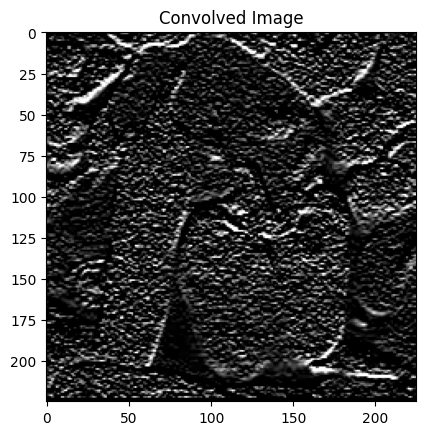

In [15]:
image = cv2.imread("images.jpeg", cv2.IMREAD_GRAYSCALE)

kernel = np.array(([1, 2,1 ], [0, 0, 0], [-1, -2, -1]))

convolved_image = cv2.filter2D(image, -1, kernel)

plt.imshow(convolved_image, cmap="gray")
plt.title("Convolved Image")
plt.show()

# Task 1: Histogram Equalization

Apply histogram equalization to an image and observe the effect on contrast.
Compare the histograms before and after equalization.

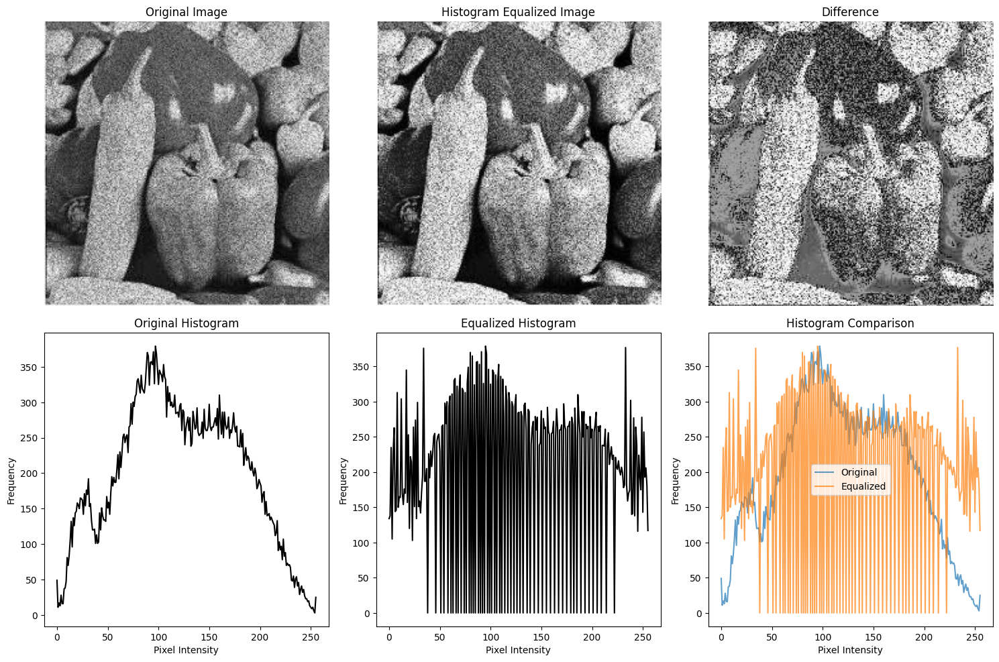

Histogram Equalization Analysis:
Original image mean intensity: 120.61
Equalized image mean intensity: 128.01
Original image std deviation: 55.91
Equalized image std deviation: 73.67


In [16]:
# Apply histogram equalization
equalized_image = cv2.equalizeHist(image)

# Create a figure with subplots for comparison
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Original image
axes[0, 0].imshow(image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Equalized image
axes[0, 1].imshow(equalized_image, cmap='gray')
axes[0, 1].set_title('Histogram Equalized Image')
axes[0, 1].axis('off')

# Difference visualization
axes[0, 2].imshow(cv2.absdiff(image, equalized_image), cmap='gray')
axes[0, 2].set_title('Difference')
axes[0, 2].axis('off')

# Original histogram
hist_original = cv2.calcHist([image], [0], None, [256], [0, 256])
axes[1, 0].plot(hist_original, color='black')
axes[1, 0].set_title('Original Histogram')
axes[1, 0].set_xlabel('Pixel Intensity')
axes[1, 0].set_ylabel('Frequency')

# Equalized histogram
hist_equalized = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])
axes[1, 1].plot(hist_equalized, color='black')
axes[1, 1].set_title('Equalized Histogram')
axes[1, 1].set_xlabel('Pixel Intensity')
axes[1, 1].set_ylabel('Frequency')

# Combined comparison
axes[1, 2].plot(hist_original, label='Original', alpha=0.7)
axes[1, 2].plot(hist_equalized, label='Equalized', alpha=0.7)
axes[1, 2].set_title('Histogram Comparison')
axes[1, 2].set_xlabel('Pixel Intensity')
axes[1, 2].set_ylabel('Frequency')
axes[1, 2].legend()

plt.tight_layout()
plt.show()

print("Histogram Equalization Analysis:")
print(f"Original image mean intensity: {np.mean(image):.2f}")
print(f"Equalized image mean intensity: {np.mean(equalized_image):.2f}")
print(f"Original image std deviation: {np.std(image):.2f}")
print(f"Equalized image std deviation: {np.std(equalized_image):.2f}")

## Discussion: Why Histogram Equalization Improves Contrast

**Key Points:**

1. **Distribution of Pixel Values**: Histogram equalization redistributes pixel intensity values more uniformly across the entire range (0-255). This spreads out the concentrated pixels that were previously clustered.

2. **Contrast Enhancement**: By stretching the histogram, the tonal range is expanded, making it easier to distinguish between different regions of the image. This increases local and global contrast.

3. **Better Visibility in Low-Light Images**: In poorly lit images, most pixel values are concentrated in the dark region. Equalization redistributes these values, making details previously hidden in dark areas more visible.

4. **Cumulative Distribution Function (CDF)**: Histogram equalization uses the CDF to transform pixel values. Each pixel is mapped to a new value based on the cumulative proportion of pixels below its current value, resulting in a more uniform distribution.

5. **Trade-offs**: While histogram equalization improves contrast, it can sometimes introduce artifacts or unnaturally enhance certain areas. Adaptive methods like CLAHE (Contrast Limited Adaptive Histogram Equalization) can address these issues.

# Task 2: Gaussian Filter

Apply a Gaussian filter to the image using different kernel sizes and sigma values.
Compare with box filter results.

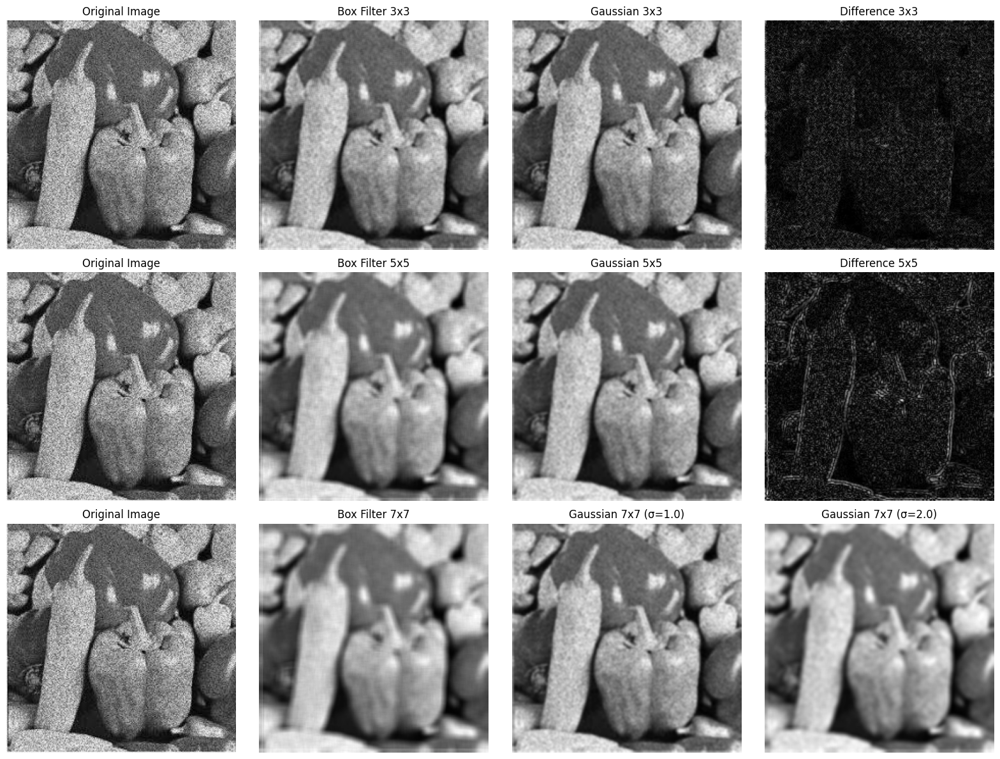

Filter Comparison:
Box Filter 3x3 - Mean: 120.29, Std: 49.22
Gaussian 3x3 - Mean: 120.41, Std: 49.76

Box Filter 5x5 - Mean: 120.27, Std: 47.05
Gaussian 5x5 - Mean: 120.33, Std: 48.53

Box Filter 7x7 - Mean: 120.25, Std: 45.24
Gaussian 7x7 (σ=1.0) - Mean: 120.34, Std: 48.60
Gaussian 7x7 (σ=2.0) - Mean: 120.27, Std: 46.33


In [17]:
# Box filter function
def box_filt(n):
    """Creates a box filter kernel of size n x n."""
    if n <= 0 or n % 2 == 0:
        raise ValueError("Window size must be a positive odd integer.")
    kernel = np.ones((n, n), np.float32) / (n * n)
    return kernel

# Create filters with different kernel sizes
fig, axes = plt.subplots(3, 4, figsize=(16, 12))

# Row 1: 3x3 filters
box_3x3 = box_filt(3)
box_filtered_3x3 = cv2.filter2D(image, -1, box_3x3)
gaussian_3x3 = cv2.GaussianBlur(image, (3, 3), 0)

axes[0, 0].imshow(image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(box_filtered_3x3, cmap='gray')
axes[0, 1].set_title('Box Filter 3x3')
axes[0, 1].axis('off')

axes[0, 2].imshow(gaussian_3x3, cmap='gray')
axes[0, 2].set_title('Gaussian 3x3')
axes[0, 2].axis('off')

axes[0, 3].imshow(cv2.absdiff(box_filtered_3x3, gaussian_3x3), cmap='gray')
axes[0, 3].set_title('Difference 3x3')
axes[0, 3].axis('off')

# Row 2: 5x5 filters
box_5x5 = box_filt(5)
box_filtered_5x5 = cv2.filter2D(image, -1, box_5x5)
gaussian_5x5 = cv2.GaussianBlur(image, (5, 5), 0)

axes[1, 0].imshow(image, cmap='gray')
axes[1, 0].set_title('Original Image')
axes[1, 0].axis('off')

axes[1, 1].imshow(box_filtered_5x5, cmap='gray')
axes[1, 1].set_title('Box Filter 5x5')
axes[1, 1].axis('off')

axes[1, 2].imshow(gaussian_5x5, cmap='gray')
axes[1, 2].set_title('Gaussian 5x5')
axes[1, 2].axis('off')

axes[1, 3].imshow(cv2.absdiff(box_filtered_5x5, gaussian_5x5), cmap='gray')
axes[1, 3].set_title('Difference 5x5')
axes[1, 3].axis('off')

# Row 3: 7x7 filters with different sigma
box_7x7 = box_filt(7)
box_filtered_7x7 = cv2.filter2D(image, -1, box_7x7)
gaussian_7x7_sigma1 = cv2.GaussianBlur(image, (7, 7), 1.0)
gaussian_7x7_sigma2 = cv2.GaussianBlur(image, (7, 7), 2.0)

axes[2, 0].imshow(image, cmap='gray')
axes[2, 0].set_title('Original Image')
axes[2, 0].axis('off')

axes[2, 1].imshow(box_filtered_7x7, cmap='gray')
axes[2, 1].set_title('Box Filter 7x7')
axes[2, 1].axis('off')

axes[2, 2].imshow(gaussian_7x7_sigma1, cmap='gray')
axes[2, 2].set_title('Gaussian 7x7 (σ=1.0)')
axes[2, 2].axis('off')

axes[2, 3].imshow(gaussian_7x7_sigma2, cmap='gray')
axes[2, 3].set_title('Gaussian 7x7 (σ=2.0)')
axes[2, 3].axis('off')

plt.tight_layout()
plt.show()

print("Filter Comparison:")
print(f"Box Filter 3x3 - Mean: {np.mean(box_filtered_3x3):.2f}, Std: {np.std(box_filtered_3x3):.2f}")
print(f"Gaussian 3x3 - Mean: {np.mean(gaussian_3x3):.2f}, Std: {np.std(gaussian_3x3):.2f}")
print()
print(f"Box Filter 5x5 - Mean: {np.mean(box_filtered_5x5):.2f}, Std: {np.std(box_filtered_5x5):.2f}")
print(f"Gaussian 5x5 - Mean: {np.mean(gaussian_5x5):.2f}, Std: {np.std(gaussian_5x5):.2f}")
print()
print(f"Box Filter 7x7 - Mean: {np.mean(box_filtered_7x7):.2f}, Std: {np.std(box_filtered_7x7):.2f}")
print(f"Gaussian 7x7 (σ=1.0) - Mean: {np.mean(gaussian_7x7_sigma1):.2f}, Std: {np.std(gaussian_7x7_sigma1):.2f}")
print(f"Gaussian 7x7 (σ=2.0) - Mean: {np.mean(gaussian_7x7_sigma2):.2f}, Std: {np.std(gaussian_7x7_sigma2):.2f}")

# Task 3: Unsharp Masking

Apply Gaussian blur and use unsharp masking to sharpen the image.

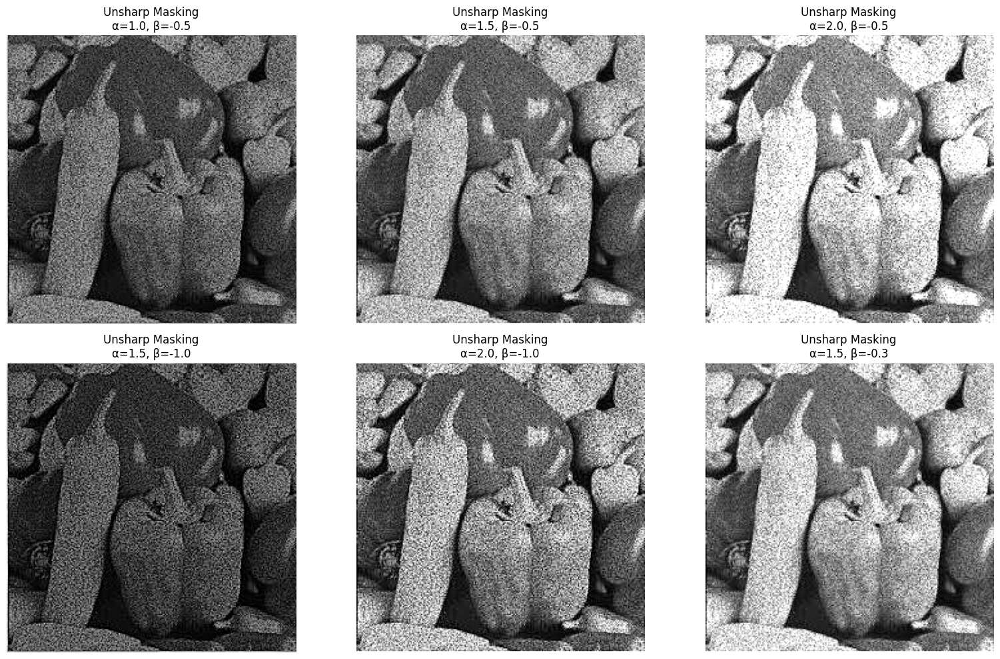

Unsharp Masking Analysis:
Original Image - Mean: 120.61, Std: 55.91
Blurred Image - Mean: 120.34, Std: 48.60

α=1.0, β=-0.5 - Mean: 60.59, Std: 34.66
α=1.5, β=-0.5 - Mean: 120.61, Std: 61.68
α=2.0, β=-0.5 - Mean: 169.63, Std: 73.35
α=1.5, β=-1.0 - Mean: 61.33, Std: 42.38
α=2.0, β=-1.0 - Mean: 120.26, Std: 67.24
α=1.5, β=-0.3 - Mean: 143.32, Std: 67.84


In [18]:
# Apply Gaussian blur for unsharp masking
blurred = cv2.GaussianBlur(image, (9, 9), 1.0)

# Create unsharp masks with different weights
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Different alpha and beta values for addWeighted
weights = [(1.0, -0.5), (1.5, -0.5), (2.0, -0.5), (1.5, -1.0), (2.0, -1.0), (1.5, -0.3)]
titles = ['α=1.0, β=-0.5', 'α=1.5, β=-0.5', 'α=2.0, β=-0.5', 
          'α=1.5, β=-1.0', 'α=2.0, β=-1.0', 'α=1.5, β=-0.3']

unsharp_images = []

for idx, (ax, (alpha, beta), title) in enumerate(zip(axes.flat, weights, titles)):
    unsharp_image = cv2.addWeighted(image, alpha, blurred, beta, 0)
    unsharp_images.append(unsharp_image)
    
    ax.imshow(unsharp_image, cmap='gray')
    ax.set_title(f'Unsharp Masking\n{title}')
    ax.axis('off')

plt.tight_layout()
plt.show()

# Compare statistics
print("Unsharp Masking Analysis:")
print(f"Original Image - Mean: {np.mean(image):.2f}, Std: {np.std(image):.2f}")
print(f"Blurred Image - Mean: {np.mean(blurred):.2f}, Std: {np.std(blurred):.2f}")
print()

for i, ((alpha, beta), title) in enumerate(zip(weights, titles)):
    print(f"{title} - Mean: {np.mean(unsharp_images[i]):.2f}, Std: {np.std(unsharp_images[i]):.2f}")

# Task 4: Parameter Variation Study

Test various combinations of filter sizes and k values for unsharp masking impact.

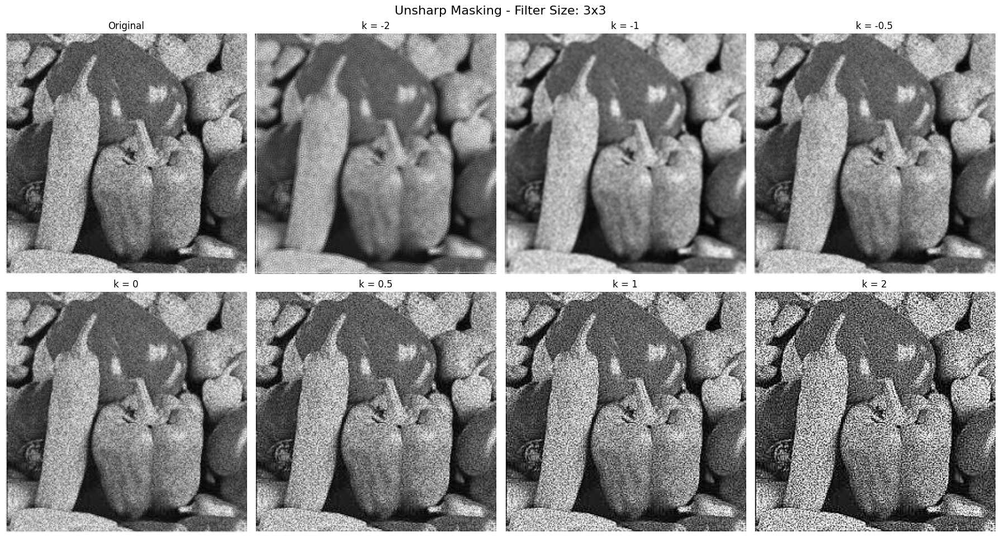

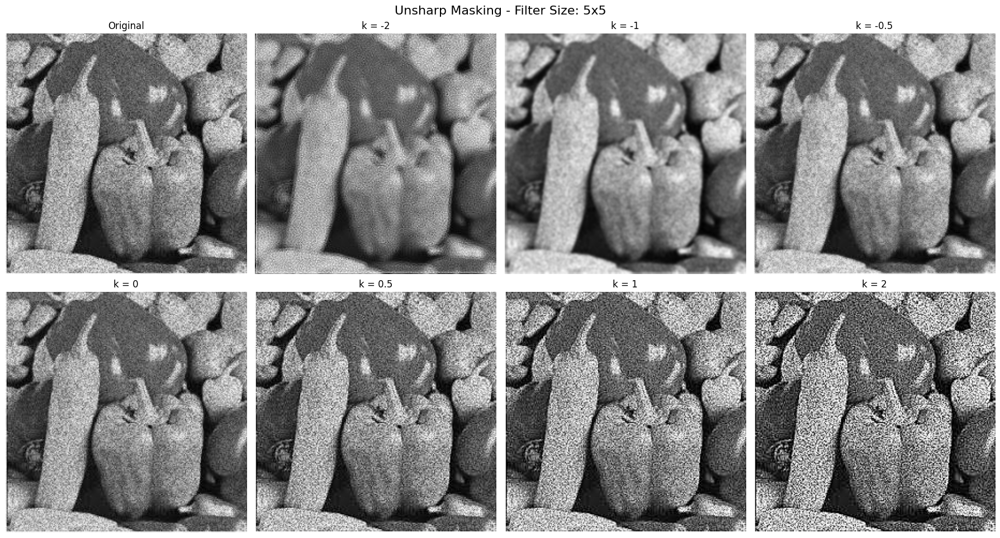

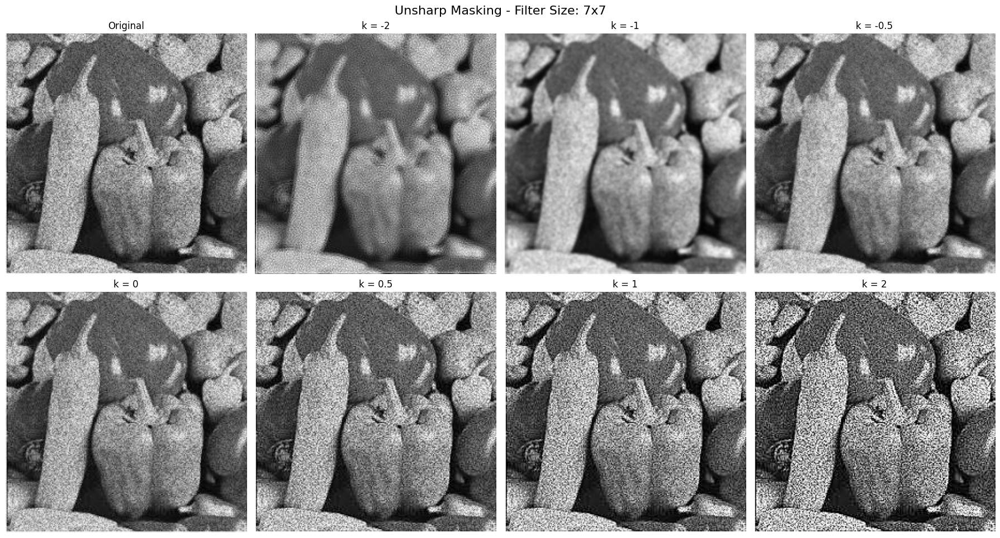

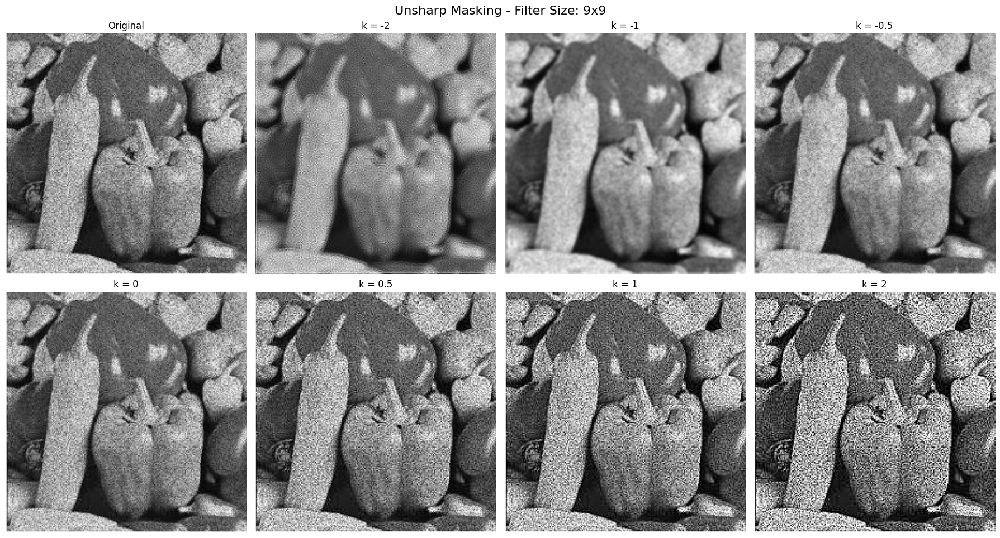

PARAMETER VARIATION ANALYSIS

Analyzing impact of filter size and k values on image statistics:


Filter Size: 3x3
------------------------------------------------------------
  k =  -2.0 | Mean:  120.10 | Std:   51.81 | Min:   0 | Max: 255
  k =  -1.0 | Mean:  120.35 | Std:   49.56 | Min:   7 | Max: 231
  k =  -0.5 | Mean:  120.48 | Std:   51.76 | Min:   4 | Max: 242
  k =   0.0 | Mean:  120.61 | Std:   55.91 | Min:   0 | Max: 255
  k =   0.5 | Mean:  120.62 | Std:   61.10 | Min:   0 | Max: 255
  k =   1.0 | Mean:  120.30 | Std:   66.22 | Min:   0 | Max: 255
  k =   2.0 | Mean:  119.18 | Std:   75.50 | Min:   0 | Max: 255

Filter Size: 5x5
------------------------------------------------------------
  k =  -2.0 | Mean:  120.07 | Std:   50.94 | Min:   0 | Max: 255
  k =  -1.0 | Mean:  120.34 | Std:   48.71 | Min:   8 | Max: 225
  k =  -0.5 | Mean:  120.47 | Std:   51.26 | Min:   4 | Max: 238
  k =   0.0 | Mean:  120.61 | Std:   55.91 | Min:   0 | Max: 255
  k =   0.5 | Mean:  120.61 | 

In [19]:
# Task 4: Parameter Variation Study
# Test various filter sizes and k values

filter_sizes = [3, 5, 7, 9]
k_values = [-2, -1, -0.5, 0, 0.5, 1, 2]

# Create comparison figures for different filter sizes
for filt_size in filter_sizes:
    fig, axes = plt.subplots(2, 4, figsize=(18, 10))
    fig.suptitle(f'Unsharp Masking - Filter Size: {filt_size}x{filt_size}', fontsize=16)
    
    # Apply Gaussian blur with the specific filter size
    blurred_temp = cv2.GaussianBlur(image, (filt_size, filt_size), 1.0)
    
    # Original image in first position
    axes[0, 0].imshow(image, cmap='gray')
    axes[0, 0].set_title('Original')
    axes[0, 0].axis('off')
    
    # Apply different k values
    for idx, k in enumerate(k_values):
        row = (idx + 1) // 4
        col = (idx + 1) % 4
        
        # unsharp masking: result = image + k * (image - blurred)
        # which is equivalent to: result = image * (1 + k) - blurred * k
        unsharp = cv2.addWeighted(image, 1 + k, blurred_temp, -k, 0)
        
        # Clip values to valid range
        unsharp = np.clip(unsharp, 0, 255).astype(np.uint8)
        
        axes[row, col].imshow(unsharp, cmap='gray')
        axes[row, col].set_title(f'k = {k}')
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

# Summary statistics for different parameters
print("=" * 80)
print("PARAMETER VARIATION ANALYSIS")
print("=" * 80)
print("\nAnalyzing impact of filter size and k values on image statistics:\n")

for filt_size in filter_sizes:
    print(f"\nFilter Size: {filt_size}x{filt_size}")
    print("-" * 60)
    blurred_temp = cv2.GaussianBlur(image, (filt_size, filt_size), 1.0)
    
    for k in k_values:
        unsharp = cv2.addWeighted(image, 1 + k, blurred_temp, -k, 0)
        unsharp = np.clip(unsharp, 0, 255).astype(np.uint8)
        
        print(f"  k = {k:5.1f} | Mean: {np.mean(unsharp):7.2f} | Std: {np.std(unsharp):7.2f} | Min: {np.min(unsharp):3d} | Max: {np.max(unsharp):3d}")
